# Four eight-cycle segments of trajectory 10 with BM4

This notebook reconstructs **trajectory 10** from the reproducible 40-trajectory campaign and follows it with `BM4Implicit`. It then reads the saved states at the exact starts of cycles **1, 9, 17, and 25** and exposes four eight-cycle trajectory segments:

$$[1,9],\quad [9,17],\quad [17,25],\quad [25,33].$$

The calculation and visualization phases are deliberately separated. The calculation phase performs one continuous integration through cycle 33 and extracts the four segments without restarting the dynamics. This preserves the absolute time of the time-dependent potential and guarantees that every segment starts at the state reached by the preceding BM4 history. The visualization phase only consumes the computed arrays, so figures can be changed or rerun without repeating the integration.

## Numerical protocol

The continuous run uses **33 normalized cycles and 200 complete fourth-order BM4 steps per cycle**, giving $\Delta t=0.005$ and 6,600 complete steps. Every step is saved, so each requested integer cycle maps to an exact array index. Each displayed segment contains 1,601 states, including both endpoints.

Physical data, trajectory selection, and Newton controls match `study_trajectory_10_recurrence_bm4.ipynb`. The four curves are segments of one trajectory rather than four independent restarts; this distinction matters because the measured effective potential is time dependent.

# Part I — Calculation

In [1]:
from pathlib import Path
from time import perf_counter
from types import SimpleNamespace

import numpy as np

from diagnostics.paths import find_project_root
from dynamics import GuidingCenterDynamics
from initial_conditions import GCInitialConfiguration
from potential import load_gc2d_h5_potential
from simulation import BM4Implicit, InitialValueProblem, SimulationRequest, simulate
from studies import latin_hypercube_gc_configuration_with_near_center

## Reproducible physical and numerical configuration

All parameters that determine the measured potential, initial point, time grid, and nonlinear solve remain explicit. The last requested segment ends at cycle 33, which determines the integration horizon.

In [ ]:
# Measured, nondimensionalized GC2D potential used in the source campaign.
project_root = find_project_root(Path.cwd())
data_path = project_root / "data/potential/V1/PHI_2.h5"
magnetic_field = 1.5
characteristic_length = 0.06
mode_selection = (0, 1)
interpolation_order = 3

# Reconstruct the exact 40-point campaign and select labelled trajectory 10.
source_particle_count = 40
selected_trajectory_number = 10
selected_particle_index = selected_trajectory_number - 1
initial_condition_seed = 20260905
domain_margin_fraction = 0.05
near_center_offset_fraction = (0.08, -0.06)

# Four eight-cycle segments read from one continuous trajectory.
segment_start_cycles = np.asarray((1, 9, 17, 25), dtype=int)
segment_cycle_count = 8
reference_final_cycle = int(segment_start_cycles[-1] + segment_cycle_count)

# Requested integration and saved-state grid.
rho = 0.3
coupling_frequency = float(0)
cycle_duration = 1.0
fine_steps_per_cycle = 200
saved_samples_per_cycle = fine_steps_per_cycle
integration_step = cycle_duration / fine_steps_per_cycle
save_interval = cycle_duration / saved_samples_per_cycle
t_span = (0.0, reference_final_cycle * cycle_duration)
step_count = reference_final_cycle * fine_steps_per_cycle
saved_sample_count = reference_final_cycle * saved_samples_per_cycle + 1

# High-precision Newton controls inherited from the source notebook.
newton_absolute_tolerance = 1e-15
newton_relative_tolerance = 1e-14
newton_max_iterations = 60
jacobian_relative_step = float(np.cbrt(np.finfo(float).eps))

if not data_path.is_file():
    raise FileNotFoundError(f"Measured HDF5 potential not found: {data_path}")
potential = load_gc2d_h5_potential(
    data_path,
    B=magnetic_field,
    characteristic_length=characteristic_length,
    indx=mode_selection,
    interpolation_order=interpolation_order,
)

source_configuration = latin_hypercube_gc_configuration_with_near_center(
    potential,
    particle_count=source_particle_count,
    seed=initial_condition_seed,
    center_offset_fraction=near_center_offset_fraction,
    domain_margin_fraction=domain_margin_fraction,
)
source_state = source_configuration.initial_state
assert source_state is not None
source_x, source_y = source_configuration.positions(source_state)
assert source_x.shape == source_y.shape == (source_particle_count,)
selected_x = float(source_x[selected_particle_index])
selected_y = float(source_y[selected_particle_index])
initial_configuration = GCInitialConfiguration.from_components(
    x=np.asarray([selected_x], dtype=float),
    y=np.asarray([selected_y], dtype=float),
)

dynamics = GuidingCenterDynamics(potential, rho=rho)
problem = InitialValueProblem(dynamics, initial_configuration)
request = SimulationRequest.uniform(
    t_span=t_span,
    max_step=integration_step,
    sample_count=saved_sample_count,
)

assert selected_particle_index == 9
np.testing.assert_array_equal(segment_start_cycles, (1, 9, 17, 25))
assert reference_final_cycle == 33
assert step_count == 6_600
assert saved_sample_count == 6_601
assert integration_step == 0.005
assert problem.particle_count == 1

## Continuous BM4 integration

This is the only long-running cell. Execute it once, then rerun any cell in Part II independently while `reference_solution` and `trajectory_segments` remain in memory.

In [3]:
method_name = "BM4Implicit"
method = BM4Implicit(
    coupling_frequency=coupling_frequency,
    newton_absolute_tolerance=newton_absolute_tolerance,
    newton_relative_tolerance=newton_relative_tolerance,
    newton_max_iterations=newton_max_iterations,
    newton_jacobian_method="analytic",
    newton_jacobian_relative_step=jacobian_relative_step,
    nonlinear_solver="newton",
    progress=True,
)

print(
    f"Starting {method_name}: trajectory {selected_trajectory_number}, "
    f"{step_count} steps through cycle {reference_final_cycle}."
)
started = perf_counter()
reference_solution = simulate(problem, method, request)
runtime_seconds = perf_counter() - started
print(f"Completed {method_name} in {runtime_seconds:.3f} s.")

Starting BM4Implicit: trajectory 10, 6600 steps through cycle 33.


BM4Implicit [==============================] 100.0% (6600/6600, t=33)67)


Completed BM4Implicit in 1128.108 s.


## Read the four cycle-start states

The indices are derived from the returned time array and audited against the requested integer cycle times. Each segment includes its start and end state, so adjacent segments share exactly one boundary sample.

In [4]:
diagnostics = reference_solution.diagnostics
assert diagnostics["projection_solver_formulation"] == "bm4_implicit_reduced"
assert int(diagnostics["step_count"]) == step_count
assert np.asarray(diagnostics["nonlinear_iterations"]).shape == (step_count,)
np.testing.assert_array_equal(reference_solution.t, request.output_times)

reference_x, reference_y = reference_solution.positions()
assert reference_x.shape == reference_y.shape == (1, saved_sample_count)

# Read exact cycle-boundary samples from the computed trajectory.
segment_start_times = segment_start_cycles.astype(float) * cycle_duration
segment_start_indices = np.searchsorted(reference_solution.t, segment_start_times)
np.testing.assert_allclose(
    reference_solution.t[segment_start_indices],
    segment_start_times,
    rtol=0.0,
    atol=10.0 * np.finfo(float).eps,
)

cell_period = float(dynamics.effective_potential.grid.period)
trajectory_segments = {}
for start_cycle, start_index in zip(segment_start_cycles, segment_start_indices, strict=True):
    end_cycle = int(start_cycle + segment_cycle_count)
    end_time = end_cycle * cycle_duration
    end_index = int(np.searchsorted(reference_solution.t, end_time))
    np.testing.assert_allclose(reference_solution.t[end_index], end_time)
    segment_slice = slice(int(start_index), end_index + 1)
    absolute_times = reference_solution.t[segment_slice].copy()
    x_values = reference_x[0, segment_slice].copy()
    y_values = reference_y[0, segment_slice].copy()
    trajectory_segments[int(start_cycle)] = SimpleNamespace(
        start_cycle=int(start_cycle),
        end_cycle=end_cycle,
        start_index=int(start_index),
        end_index=end_index,
        absolute_times=absolute_times,
        elapsed_cycles=(absolute_times - absolute_times[0]) / cycle_duration,
        x=x_values,
        y=y_values,
        start_position=np.asarray((x_values[0], y_values[0])),
        end_position=np.asarray((x_values[-1], y_values[-1])),
    )

assert tuple(trajectory_segments) == (1, 9, 17, 25)
assert all(
    segment.x.size == segment_cycle_count * saved_samples_per_cycle + 1
    for segment in trajectory_segments.values()
)
for left_start, right_start in zip(segment_start_cycles[:-1], segment_start_cycles[1:]):
    np.testing.assert_allclose(
        trajectory_segments[int(left_start)].end_position,
        trajectory_segments[int(right_start)].start_position,
        rtol=0.0,
        atol=0.0,
    )

segment_start_positions = np.vstack([
    segment.start_position for segment in trajectory_segments.values()
])
segment_end_positions = np.vstack([
    segment.end_position for segment in trajectory_segments.values()
])

def minimum_image_displacement(values, reference, period):
    '''Return periodic displacements reduced to the nearest cell image.'''
    return (np.asarray(values) - np.asarray(reference) + 0.5 * period) % period - 0.5 * period


def break_periodic_jumps(x_values, y_values, period):
    '''Insert NaNs so wrapped cell crossings do not create false plot chords.'''
    plot_x = np.asarray(x_values, dtype=float).copy()
    plot_y = np.asarray(y_values, dtype=float).copy()
    jumps = (np.abs(np.diff(plot_x)) > 0.5 * period) | (
        np.abs(np.diff(plot_y)) > 0.5 * period
    )
    plot_x[1:][jumps] = np.nan
    plot_y[1:][jumps] = np.nan
    return plot_x, plot_y


# Compare corresponding local-time samples with the segment that starts at cycle 1.
baseline_segment = trajectory_segments[1]
aligned_segment_distances = {}
for start_cycle, segment in trajectory_segments.items():
    np.testing.assert_allclose(segment.elapsed_cycles, baseline_segment.elapsed_cycles)
    dx = minimum_image_displacement(segment.x, baseline_segment.x, cell_period)
    dy = minimum_image_displacement(segment.y, baseline_segment.y, cell_period)
    aligned_segment_distances[start_cycle] = np.hypot(dx, dy)

maximum_residual_ratio = float(np.max(
    np.asarray(diagnostics["nonlinear_residual_norms"])
    / np.asarray(diagnostics["nonlinear_tolerances"])
))
assert maximum_residual_ratio <= 1.0

# Part II — Visualization

In [5]:
from IPython.display import Markdown, display
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.collections import LineCollection
from matplotlib.lines import Line2D

from visualization import display_animation, display_records_table, plot_implicit_method_iterations

plt.rcParams.update({"figure.dpi": 110, "axes.grid": True})
segment_colors = dict(zip(segment_start_cycles, plt.get_cmap("tab10").colors[:4], strict=True))

## Calculation audit and exact starting points

The first table audits the continuous integration. The second table reports the four positions read directly from the solution at the requested cycle boundaries. Periodic displacement is measured relative to the start of cycle 1.

In [6]:
run_rows = (
    SimpleNamespace(
        method=method_name,
        steps=int(diagnostics["step_count"]),
        saved_states=reference_solution.t.size,
        runtime=runtime_seconds,
        mean_corrections=float(np.mean(diagnostics["nonlinear_iterations"])),
        maximum_corrections=int(np.max(diagnostics["nonlinear_iterations"])),
        maximum_residual_ratio=maximum_residual_ratio,
    ),
)
display_records_table(
    run_rows,
    columns=(
        ("method", "Method", None),
        ("steps", "Complete steps", "d"),
        ("saved_states", "Saved states", "d"),
        ("runtime", "Runtime [s]", ".3f"),
        ("mean_corrections", "Mean corrections/step", ".3f"),
        ("maximum_corrections", "Max corrections/step", "d"),
        ("maximum_residual_ratio", "Max residual/tolerance", ".3e"),
    ),
)

start_rows = []
first_start = segment_start_positions[0]
for row_index, (start_cycle, segment) in enumerate(trajectory_segments.items()):
    displacement = minimum_image_displacement(
        segment.start_position, first_start, cell_period
    )
    start_rows.append(SimpleNamespace(
        segment=row_index + 1,
        start_cycle=start_cycle,
        end_cycle=segment.end_cycle,
        sample_index=segment.start_index,
        x=segment.start_position[0],
        y=segment.start_position[1],
        dx_from_cycle_1=displacement[0],
        dy_from_cycle_1=displacement[1],
        distance_from_cycle_1=float(np.linalg.norm(displacement)),
    ))
display_records_table(
    tuple(start_rows),
    columns=(
        ("segment", "Segment", "d"),
        ("start_cycle", "Start cycle", "d"),
        ("end_cycle", "End cycle", "d"),
        ("sample_index", "Start sample", "d"),
        ("x", "Start x", ".10f"),
        ("y", "Start y", ".10f"),
        ("dx_from_cycle_1", "Periodic dx from cycle 1", ".5e"),
        ("dy_from_cycle_1", "Periodic dy from cycle 1", ".5e"),
        ("distance_from_cycle_1", "Distance from cycle 1", ".5e"),
    ),
)

Method,Complete steps,Saved states,Runtime [s],Mean corrections/step,Max corrections/step,Max residual/tolerance
BM4Implicit,6600,6601,1128.108,1.000,1,2.225e-01


Segment,Start cycle,End cycle,Start sample,Start x,Start y,Periodic dx from cycle 1,Periodic dy from cycle 1,Distance from cycle 1
1,1,9,200,12.2172051383,13.1282455659,0.00000e+00,0.00000e+00,0.00000e+00
2,9,17,1800,12.4196720440,13.2361531416,2.02467e-01,1.07908e-01,2.29427e-01
3,17,25,3400,12.5396067244,13.3276896881,3.22402e-01,1.99444e-01,3.79105e-01
4,25,33,5000,12.2471461726,13.4127486802,2.99410e-02,2.84503e-01,2.86074e-01


## Individual eight-cycle trajectories

Each panel uses the effective-potential field at that segment's absolute start time. A star marks the state read at the requested start cycle and a circle marks the state eight cycles later. Lines are broken at periodic cell boundaries to avoid drawing artificial chords across the domain.

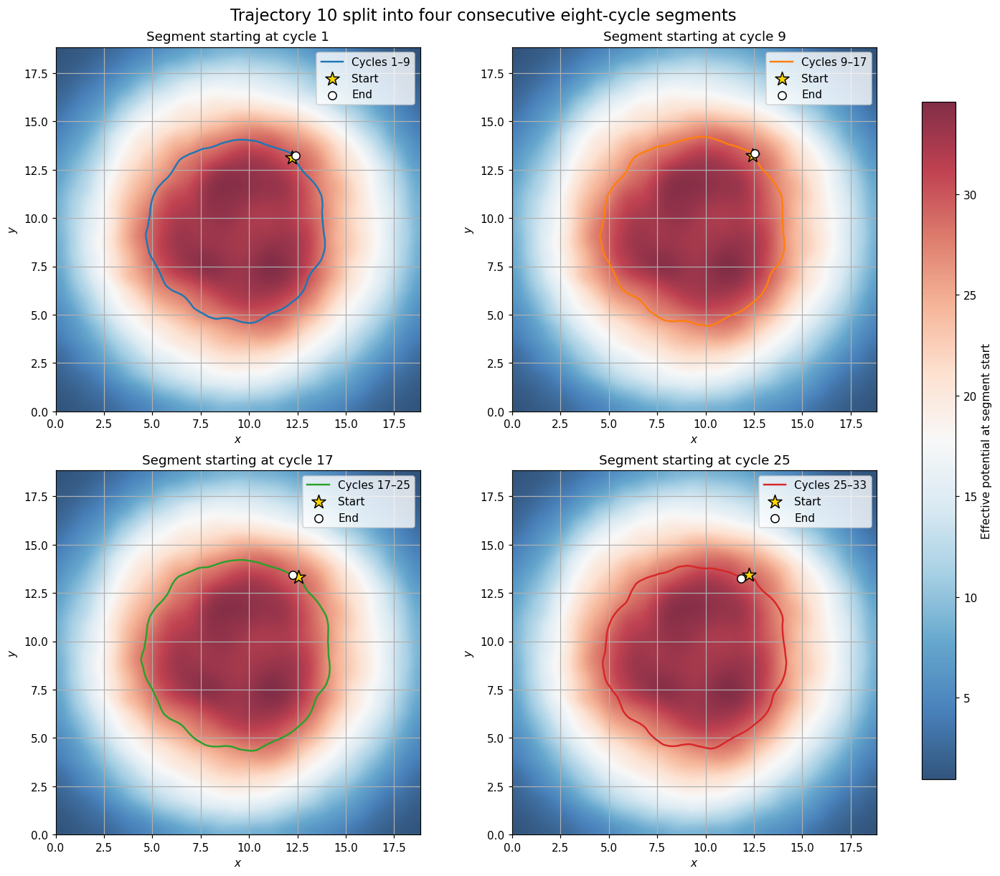

In [7]:
grid = dynamics.effective_potential.grid
extent = (grid.xmin, grid.xmin + grid.period, grid.ymin, grid.ymin + grid.period)
figure, axes = plt.subplots(2, 2, figsize=(13, 11), constrained_layout=True)
for axis, (start_cycle, segment) in zip(axes.flat, trajectory_segments.items(), strict=True):
    field_at_start = np.asarray(
        dynamics.effective_potential.evaluate_grid(start_cycle * cycle_duration),
        dtype=float,
    )
    image = axis.imshow(
        field_at_start.T,
        origin="lower",
        extent=extent,
        cmap="RdBu_r",
        aspect="equal",
        alpha=0.82,
    )
    plot_x, plot_y = break_periodic_jumps(segment.x, segment.y, cell_period)
    axis.plot(
        plot_x,
        plot_y,
        color=segment_colors[start_cycle],
        linewidth=1.6,
        label=f"Cycles {start_cycle}–{segment.end_cycle}",
    )
    axis.scatter(
        *segment.start_position,
        marker="*",
        s=170,
        color="gold",
        edgecolor="black",
        zorder=4,
        label="Start",
    )
    axis.scatter(
        *segment.end_position,
        marker="o",
        s=55,
        color="white",
        edgecolor="black",
        zorder=4,
        label="End",
    )
    axis.set(
        title=f"Segment starting at cycle {start_cycle}",
        xlabel="$x$",
        ylabel="$y$",
        xlim=extent[:2],
        ylim=extent[2:],
    )
    axis.legend(loc="upper right")

colorbar = figure.colorbar(image, ax=axes, shrink=0.86, label="Effective potential at segment start")
figure.suptitle("Trajectory 10 split into four consecutive eight-cycle segments", fontsize=15)
plt.show()

## Four-segment overlay

This view places the four paths in the same periodic cell. Matching star and circle markers identify each segment's start and end states.

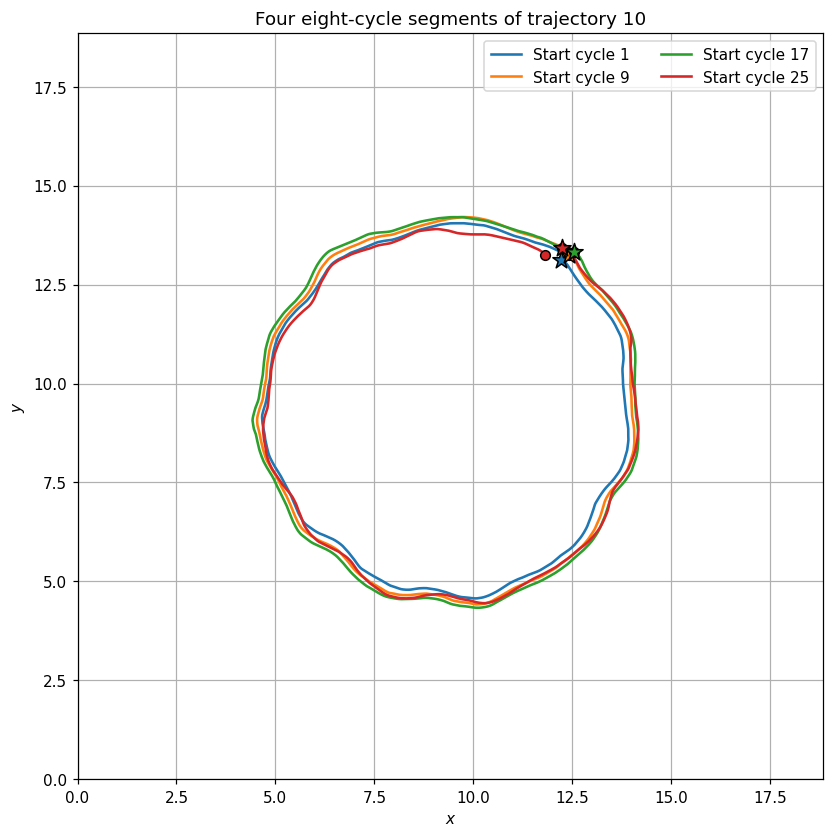

In [8]:
figure, axis = plt.subplots(figsize=(8.5, 7.5), constrained_layout=True)
for start_cycle, segment in trajectory_segments.items():
    plot_x, plot_y = break_periodic_jumps(segment.x, segment.y, cell_period)
    color = segment_colors[start_cycle]
    axis.plot(
        plot_x,
        plot_y,
        color=color,
        linewidth=1.7,
        label=f"Start cycle {start_cycle}",
    )
    axis.scatter(*segment.start_position, marker="*", s=140, color=color, edgecolor="black", zorder=4)
    axis.scatter(*segment.end_position, marker="o", s=40, color=color, edgecolor="black", zorder=4)

axis.set(
    title="Four eight-cycle segments of trajectory 10",
    xlabel="$x$",
    ylabel="$y$",
    xlim=extent[:2],
    ylim=extent[2:],
    aspect="equal",
)
axis.legend(ncol=2)
plt.show()

## Interactive aligned-segment animation

The four eight-cycle segments advance together on a common elapsed-cycle clock. Each colored trail starts at its requested cycle boundary, and the moving circle marks its current position. The potential field is omitted because the four segments have different absolute times and therefore do not share a single instantaneous field.

In [9]:
animation_frames = min(161, baseline_segment.elapsed_cycles.size)
animation_fps = 10
animation_indices = np.unique(np.rint(np.linspace(
    0,
    baseline_segment.elapsed_cycles.size - 1,
    animation_frames,
)).astype(int))
animation_starts = tuple(trajectory_segments)
animation_colors = [segment_colors[start_cycle] for start_cycle in animation_starts]

wrapped_segment_positions = {}
for start_cycle, segment in trajectory_segments.items():
    wrapped_segment_positions[start_cycle] = (
        grid.xmin + (segment.x - grid.xmin) % cell_period,
        grid.ymin + (segment.y - grid.ymin) % cell_period,
    )

animation_figure, animation_axis = plt.subplots(
    figsize=(8.5, 7.5), constrained_layout=True
)
animated_paths = LineCollection(
    [],
    colors=animation_colors,
    linewidths=1.8,
    alpha=0.9,
    zorder=3,
)
animation_axis.add_collection(animated_paths)
start_points = np.asarray([
    (wrapped_segment_positions[start_cycle][0][0],
     wrapped_segment_positions[start_cycle][1][0])
    for start_cycle in animation_starts
])
animation_axis.scatter(
    start_points[:, 0],
    start_points[:, 1],
    marker="*",
    s=150,
    c=animation_colors,
    edgecolor="black",
    linewidth=0.7,
    zorder=5,
)
current_points = animation_axis.scatter(
    start_points[:, 0],
    start_points[:, 1],
    marker="o",
    s=52,
    c=animation_colors,
    edgecolor="white",
    linewidth=0.7,
    zorder=6,
)
legend_handles = [
    Line2D(
        [0],
        [0],
        color=segment_colors[start_cycle],
        marker="o",
        label=f"Start cycle {start_cycle}",
    )
    for start_cycle in animation_starts
]
animation_axis.set(
    xlabel="$x$",
    ylabel="$y$",
    xlim=extent[:2],
    ylim=extent[2:],
    aspect="equal",
)
animation_axis.legend(handles=legend_handles, ncol=2, loc="upper right")

def update_four_segment_animation(frame_number):
    '''Update four accumulated paths at a common elapsed time.'''
    sample_index = int(animation_indices[frame_number])
    path_values = []
    current_values = []
    for start_cycle in animation_starts:
        x_values, y_values = wrapped_segment_positions[start_cycle]
        plot_x, plot_y = break_periodic_jumps(
            x_values[:sample_index + 1],
            y_values[:sample_index + 1],
            cell_period,
        )
        path_values.append(np.column_stack((plot_x, plot_y)))
        current_values.append((x_values[sample_index], y_values[sample_index]))
    animated_paths.set_segments(path_values)
    current_points.set_offsets(np.asarray(current_values))
    elapsed_cycle = baseline_segment.elapsed_cycles[sample_index]
    animation_axis.set_title(
        f"Four trajectory-10 segments at elapsed cycle {elapsed_cycle:.3f}"
    )
    return animated_paths, current_points, animation_axis.title

four_segment_animation = FuncAnimation(
    animation_figure,
    update_four_segment_animation,
    frames=animation_indices.size,
    interval=int(round(1000.0 / animation_fps)),
    blit=False,
    repeat=True,
    cache_frame_data=False,
)
display_animation(
    four_segment_animation,
    embed_limit_mb=100.0,
    interactive=True,
)

Once 
 
 Loop 
 
 Reflect

## Alignment with the first segment

At each common elapsed time, the plot measures the minimum-image periodic distance between a segment and the segment beginning at cycle 1. Small values indicate that the eight-cycle path is being repeated geometrically; the cycle-1 baseline is identically zero.

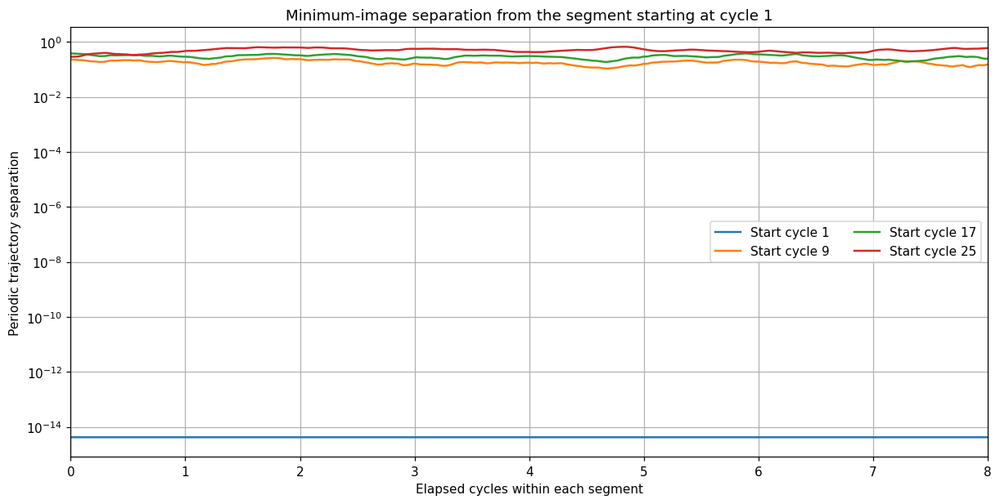

In [10]:
figure, axis = plt.subplots(figsize=(11, 5.5), constrained_layout=True)
distance_floor = np.finfo(float).eps * cell_period
for start_cycle, distances in aligned_segment_distances.items():
    axis.semilogy(
        baseline_segment.elapsed_cycles,
        np.maximum(distances, distance_floor),
        color=segment_colors[start_cycle],
        linewidth=1.6,
        label=f"Start cycle {start_cycle}",
    )
axis.set(
    title="Minimum-image separation from the segment starting at cycle 1",
    xlabel="Elapsed cycles within each segment",
    ylabel="Periodic trajectory separation",
    xlim=(0.0, float(segment_cycle_count)),
)
axis.legend(ncol=2)
plt.show()

## Nonlinear-solver audit

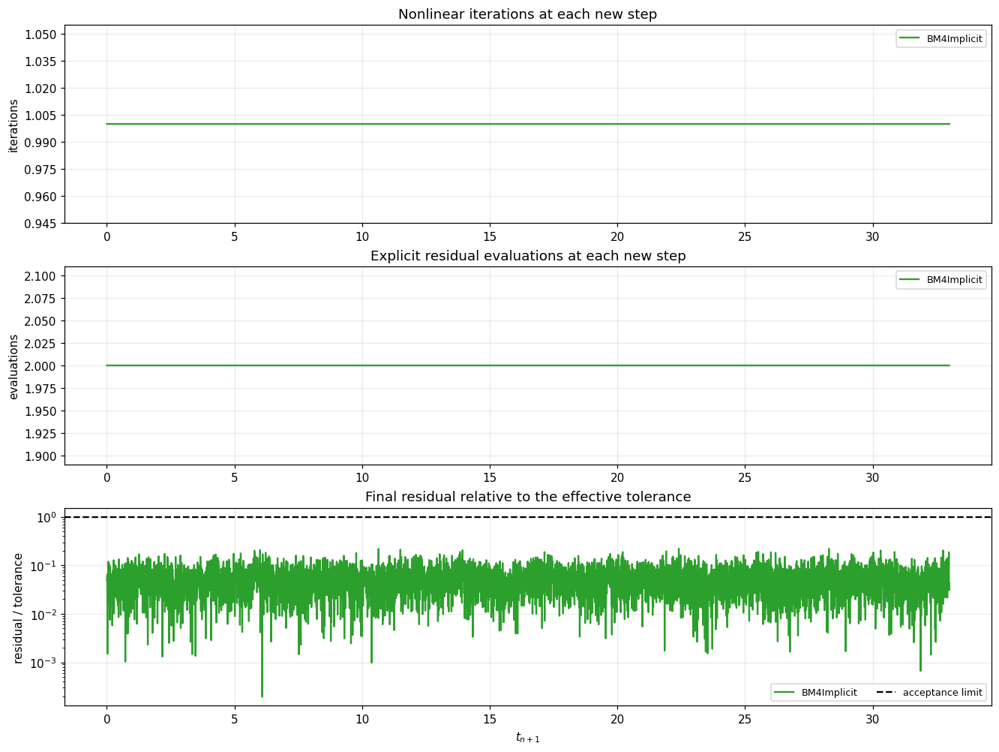

In [11]:
plot_implicit_method_iterations({method_name: reference_solution})
plt.show()

## Data-driven segment summary

In [12]:
summary_lines = []
for start_cycle in segment_start_cycles[1:]:
    distances = aligned_segment_distances[int(start_cycle)]
    summary_lines.append(
        f"- **Segment starting at cycle {int(start_cycle)} versus cycle 1:** "
        f"RMS separation `{np.sqrt(np.mean(distances**2)):.6e}`; "
        f"maximum separation `{np.max(distances):.6e}`."
    )

consecutive_start_distances = []
for previous, current in zip(segment_start_positions[:-1], segment_start_positions[1:]):
    displacement = minimum_image_displacement(current, previous, cell_period)
    consecutive_start_distances.append(float(np.linalg.norm(displacement)))
summary_lines.append(
    "- **Consecutive eight-cycle start-point distances:** "
    + ", ".join(f"`{distance:.6e}`" for distance in consecutive_start_distances)
    + "."
)
summary_lines.append(
    f"- **Integration audit:** maximum residual/tolerance ratio "
    f"`{maximum_residual_ratio:.6e}` across `{step_count}` BM4 steps."
)
display(Markdown("\n".join(summary_lines)))

- **Segment starting at cycle 9 versus cycle 1:** RMS separation `1.812282e-01`; maximum separation `2.613954e-01`.
- **Segment starting at cycle 17 versus cycle 1:** RMS separation `2.959847e-01`; maximum separation `3.791052e-01`.
- **Segment starting at cycle 25 versus cycle 1:** RMS separation `5.025842e-01`; maximum separation `6.655428e-01`.
- **Consecutive eight-cycle start-point distances:** `2.294273e-01`, `1.508750e-01`, `3.045787e-01`.
- **Integration audit:** maximum residual/tolerance ratio `2.224505e-01` across `6600` BM4 steps.